# TFM in R: Bayesian fits with errors

1. Data
2. Scale Relation
3. Stan Model - GAMA
4. Stan Model - Fitting Zero Points
5. Resume Scale Relations Fits \
   Extra: diagMCMC

En este cuaderno vamos a calcular y representar los ajustes bayesianos realizados ya en TFM_Python.ipynb para las muestras control y galaxias en filamentos/tendrils/voids con GAMA de fondo teniendo en cuenta los errores (además de quitar outliers y ajustando al punto cero).

In [68]:
# Packages
library('bayesboot')
library('bayesplot')
library('bfw')
library('cmdstanr')
library('coda')
library('ggplot2')
library('gridExtra')
library('latex2exp')
library('loo')
library('rstan')
library('shinystan')

# Options fron RStan
options(mc.cores = parallel::detectCores())

## 1. Data

Exportamos los datos necesarios para plotear y trabajar con las relaciones de escala. En un principio, se trató de exportar los datos como .fits pero dado el peso computacional de esto, se optó por trabajar con DataFrames.

In [4]:
data_GAMA = read.table("./DataFrames_and_Tables/errors_data_GAMA.txt", header = TRUE)
head(data_GAMA)

data_fil = read.table("./DataFrames_and_Tables/errors_data_fil.txt", header = TRUE)
head(data_fil)
data_filclone = read.table("./DataFrames_and_Tables/errors_data_filclone.txt", header = TRUE)
head(data_filclone)

data_tendril = read.table("./DataFrames_and_Tables/errors_data_tendril.txt", header = TRUE)
#head(data_tendril)
data_tendrilclone = read.table("./DataFrames_and_Tables/errors_data_tendrilclone.txt", header = TRUE)
#head(data_tendrilclone)

data_void = read.table("./DataFrames_and_Tables/errors_data_void.txt", header = TRUE)
#head(data_void)
data_voidclone = read.table("./DataFrames_and_Tables/errors_data_voidclone.txt", header = TRUE)
#head(data_voidclone)

,METALLICIY,e_METALLICIY,logSFR,e_logSFR,logmstar,e_logmstar
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,12.46641,0.07996802,-27.04210,0.05882763,10.147060,0.1221463
2,12.31793,0.01168051,-29.03130,0.03956000,10.430694,0.1194587
3,12.31745,0.02405830,-27.12045,0.09324995,9.944313,0.1088133
4,12.26342,0.14632108,-27.44695,0.22658399,9.608382,0.1310699
5,12.09179,0.01656325,-25.16081,0.02823698,10.078999,0.1254810
6,11.92664,0.04976158,-23.66337,0.15370385,10.200748,0.1190530


,METALLICIY_fil,e_METALLICIY_fil,logSFR_fil,e_logSFR_fil,logmstar_fil,e_logmstar_fil
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,8.755937,0.01255797,1.38385484,0.45367195,10.55411,0.1218991
2,8.664575,0.01317990,1.33739755,0.72981635,10.70610,0.1301063
3,8.687973,0.02755186,-0.04442307,0.11112785,10.48715,0.1055122
4,8.669125,0.01305276,0.77311541,0.19842076,10.47533,0.1125867
5,8.668772,0.00488124,1.21055570,0.05058564,10.62921,0.1148929
6,8.787833,0.05264440,0.24125637,0.12919162,10.40177,0.1220163


,METALLICIY_filclone,e_METALLICIY_filclone,logSFR_filclone,e_logSFR_filclone,logmstar_filclone,e_logmstar_filclone
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,8.406867,0.036307807,-0.07710411,0.17343741,9.540344,0.1345864
2,8.286560,0.059006810,0.26628926,0.51681469,9.547843,0.1412421
3,8.406582,0.024338085,0.43983497,0.18039439,9.557239,0.1084155
4,8.493923,0.008066897,0.24032239,0.06999319,9.635133,0.1319111
5,8.386024,0.034949535,1.12831888,1.13513126,9.644365,0.1286026
6,8.576822,0.020216868,0.27587050,0.09591036,9.646029,0.1159774


### 1.1. Without Outliers

Antes de empezar con los ajustes bayesianos vamos a omitir las galaxias outliers creando una máscara. 

In [5]:
# Mask for M-SFR Relation
maskSFR = data_GAMA$logmstar >= 8 & data_GAMA$logmstar <= 11.7 & data_GAMA$logSFR >= -2.2 & data_GAMA$logSFR <= 2.2

# Mas for M-Z Relation
maskZ = data_GAMA$logmstar >= 8 & data_GAMA$logmstar <= 11.7 & data_GAMA$METALLICIY >= 7.8 & data_GAMA$METALLICIY <= 9.1

## 2. Scale Relations

En esta sección ploteamos las relaciones a escala.

### 2.1. M-SFR Relation 


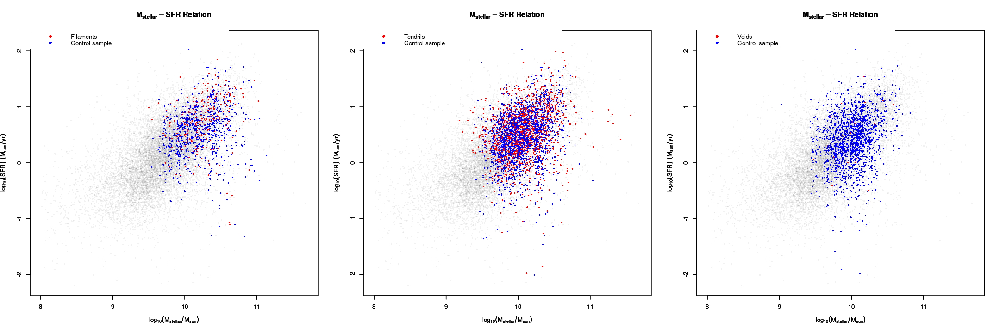

In [6]:
par(mfrow = c(1, 3))
options(repr.plot.width = 18, repr.plot.height = 6)

xlim = c(8, 11.7)
ylim = c(-2.2, 2.2)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(log[10](SFR)~(M[sun]/yr)))
title = expression(paste(bold(M[stellar]-SFR~Relation)))

# PLOT -----------------------------------------------------------------------------------------------------------------------------------
plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_fil$logmstar_fil, data_fil$logSFR_fil, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_filclone$logmstar_filclone, data_filclone$logSFR_filclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

legend('topleft', legend=c('Filaments', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------
plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_tendril$logmstar_tendril, data_tendril$logSFR_tendril, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_tendrilclone$logmstar_tendrilclone, data_tendrilclone$logSFR_tendrilclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

legend('topleft', legend=c('Tendrils', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------
plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_void$logmstar_void, data_void$logSFR_void, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_voidclone$logmstar_voidclone, data_voidclone$logSFR_voidclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

legend('topleft', legend=c('Voids', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

### 2.2. M-Z Relation

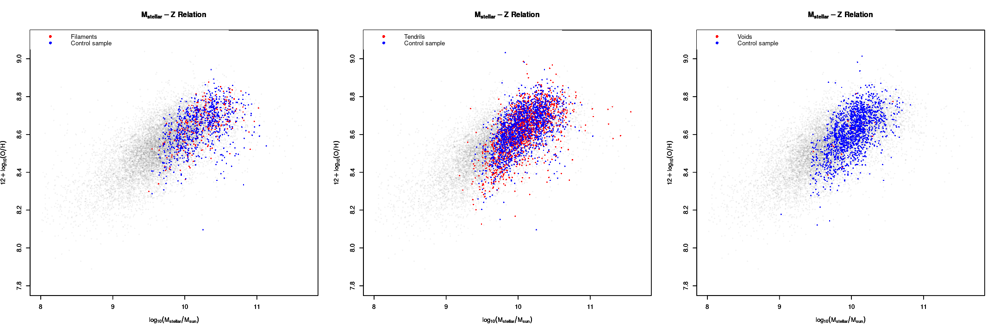

In [7]:
par(mfrow = c(1, 3))
options(repr.plot.width = 18, repr.plot.height = 6)

xlim = c(8,11.7)
ylim = c(7.8,9.1)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(12+log[10](O/H)))
title = expression(paste(bold(M[stellar]-Z~Relation)))

# PLOT -----------------------------------------------------------------------------------------------------------------------------------
plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_fil$logmstar_fil, data_fil$METALLICIY_fil, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_filclone$logmstar_filclone, data_filclone$METALLICIY_filclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

legend('topleft', legend=c('Filaments', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------
plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_tendril$logmstar_tendril, data_tendril$METALLICIY_tendril, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_tendrilclone$logmstar_tendrilclone, data_tendrilclone$METALLICIY_tendrilclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

legend('topleft', legend=c('Tendrils', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------
plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_void$logmstar_void, data_void$METALLICIY_void, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_voidclone$logmstar_voidclone, data_voidclone$METALLICIY_voidclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

legend('topleft', legend=c('Voids', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

## 3. Stan Model - GAMA

En esta sección vamos crear nuestro modelo de Stan para realizar ajustes bayesianos para los datos de GAMA. Representaremos las anteriores relaciones de escala con sus ajustes bayesianos. Nótese que crearemos dos modelos de Stan: uno para ajustes bayesianos de primer orden (`stan_code_1st_order` ,M_SFR Relation) y otro para ajustes bayesianos de tercer orden (`stan_code_2nd_order`, M-Z Relation). 

In [8]:
# Stan Model with errors: 1st order
stan_code_1st_order = '
data {
    int<lower=0> N;
    vector[N] obsx;
    vector[N] obsy;
    vector<lower=0>[N] errx;
    vector<lower=0>[N] erry;
}

parameters {
    real beta0;
    real beta1;
    real<lower=0> sigma;
    vector[N] xreal;
    vector[N] yreal;
}

model {
    xreal ~ normal(0.,10.);
    obsx ~ normal(xreal, errx);
    yreal ~ normal(beta0 + beta1 * xreal, sigma);
    obsy ~ normal(yreal, erry);
    beta0 ~ normal(0., 10.);
    beta1 ~ normal(0., 10.);
    sigma ~ cauchy(0., 10.);
}
'

# Call to the model
stan_model_1st_order = stan_model(model_code = stan_code_1st_order)

In [9]:
# Stan Model with errors: 2nd order with errors
stan_code_2nd_order = '
data {
    int<lower=0> N;
    vector[N] obsx;
    vector[N] obsy;
    vector<lower=0>[N] errx;
    vector<lower=0>[N] erry;
}

parameters {
    real beta0;
    real beta1;
    real beta2;
    real<lower=0> sigma;
    vector[N] xreal;
    vector[N] yreal;
}

model {
    xreal ~ normal(0.,100.);
    obsx ~ normal(xreal, errx);
    yreal ~ normal(beta0 + beta1 * xreal + beta2 * xreal.^2, sigma);
    obsy ~ normal(yreal, erry);
    beta0 ~ normal(0., 100.);
    beta1 ~ normal(0., 100.);
    beta2 ~ normal(0., 100.);
    sigma ~ cauchy(0., 100.);
}
'

# Call to the model
stan_model_2nd_order = stan_model(model_code = stan_code_2nd_order)

### 3.1. M-SFR Relations

#### GAMA

Vamos a realizar el ajuste de primer orden para la M-SFR Relation de los datos de GAMA. Nos guardamos el valor de la pendiente (`b_SFR_black`), el cual nos interesa para el ajuste del punto cero (fitting the zero-point). 

Nota: Para evitar que este cuaderno tarde mucho en ejecutarse, llamamos simplemente a los resultados guardados en un archivo _.rds_. En las variables `a_SFR_black` y `b_SFR_black`recogemos los resultados que daría si se ejecutasen el código.

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
beta0,-7.0126449,0.0019656431,0.086621576,-7.1816843,-7.0715262,-7.0124732,-6.9545251,-6.8461331,1941.971,0.9998232
beta1,0.7366813,0.0002024769,0.008904053,0.7195783,0.7307341,0.7366757,0.7427072,0.7539875,1933.857,0.9998755


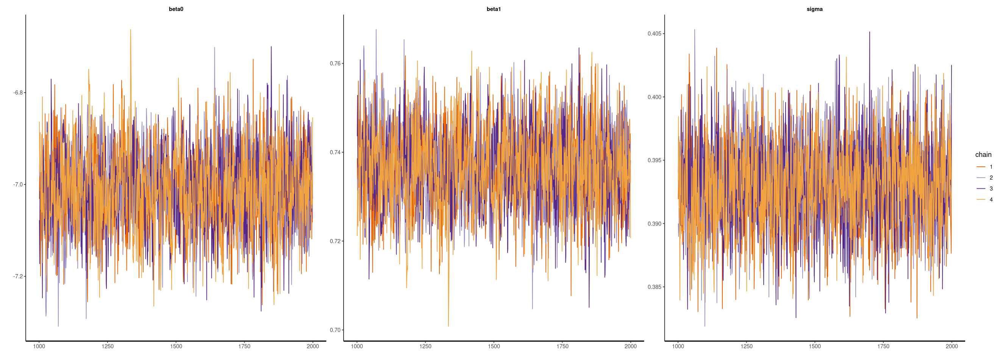

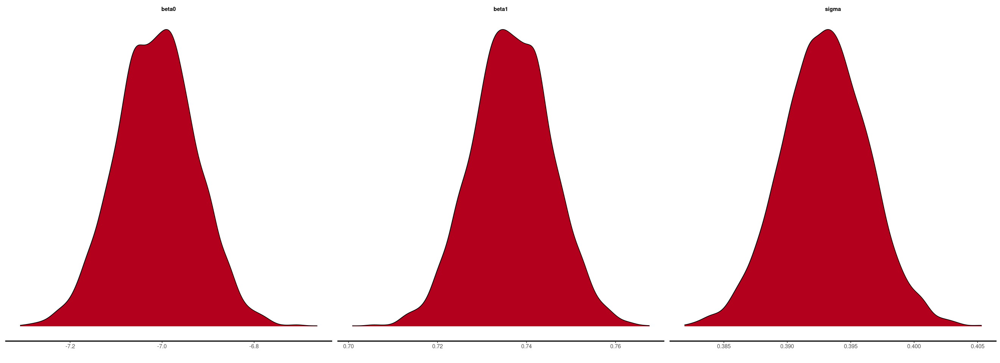

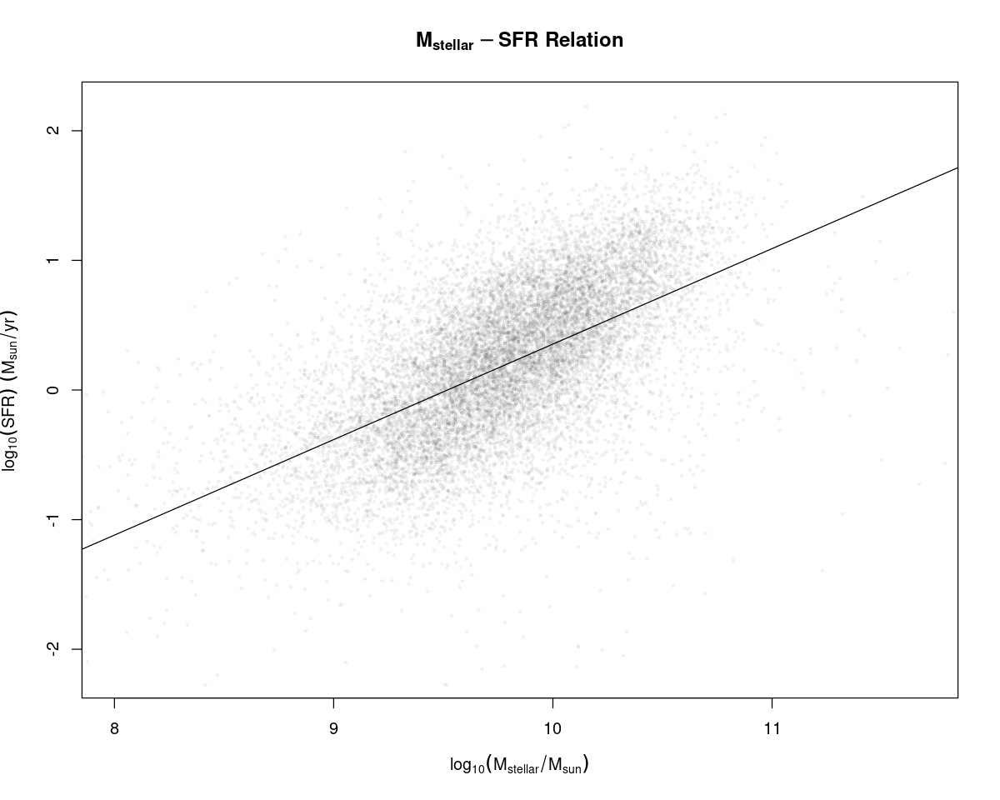

In [10]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------

# Black fit (GAMA)
fit_results_GAMASFR_black = readRDS('DataFrames_and_Tables/fit_results_GAMASFR_black.rds')
summary(fit_results_GAMASFR_black, par = c('beta0', 'beta1'))$summary

options(repr.plot.width = 22, repr.plot.height = 8)
stan_trace(fit_results_GAMASFR_black, par = c('beta0', 'beta1', 'sigma'))
stan_dens(fit_results_GAMASFR_black, par = c('beta0', 'beta1', 'sigma'))

a_SFR_black = mean(as.numeric(as.numeric(extract(fit_results_GAMASFR_black)$beta0))) # -7.0145932  
b_SFR_black = mean(as.numeric(as.numeric(extract(fit_results_GAMASFR_black)$beta1))) # 0.7368692 

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(-2.2, 2.2)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(log[10](SFR)~(M[sun]/yr)))
title = expression(paste(bold(M[stellar]-SFR~Relation)))

# Scatter Plots
options(repr.plot.width = 10, repr.plot.height = 8)
plot(data_GAMA$logmstar, data_GAMA$logSFR, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)

# Bayesian Fits
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

### 3.2. M-Z Relation

#### GAMA

Vamos a realizar el ajuste de segundo orden para la M-Z Relation de los datos de GAMA. Nos guardamos el valor de las pendientes (`b_SFR_black` y `c_SFR_black`), el cual nos interesa para el ajuste del punto cero (fitting the zero-point). 

Nota:  Para evitar que este cuaderno tarde mucho en ejecutarse, llamamos simplemente a los resultados guardados en un archivo _.rds_. En las variables `a_SFR_black`, `b_SFR_black` y `c_SFR_black` recogemos los resultados que daría si se ejecutasen esas líneas. 

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
beta0,3.24586245,4.298621e-03,0.251739322,2.75579737,3.07635977,3.24557354,3.41614611,3.73948200,3429.603,1.000796
beta1,0.89633870,8.858452e-04,0.051841403,0.79573305,0.86153300,0.89649871,0.93119868,0.99700056,3424.821,1.000801
beta2,-0.03606451,4.558009e-05,0.002665769,-0.04122304,-0.03787681,-0.03608561,-0.03426717,-0.03090415,3420.541,1.000811


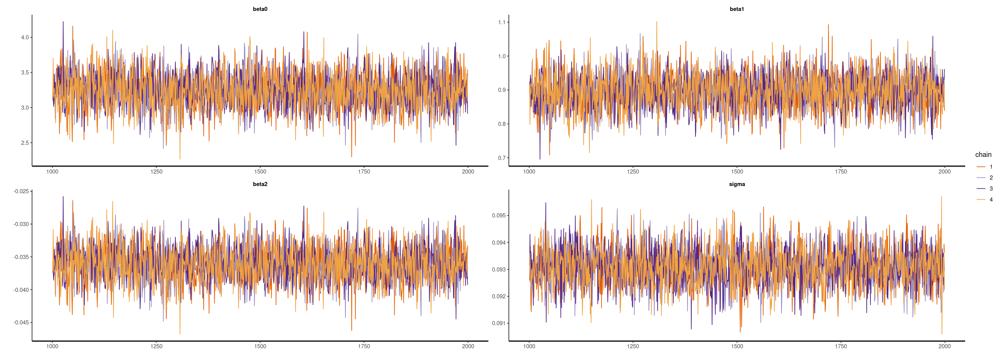

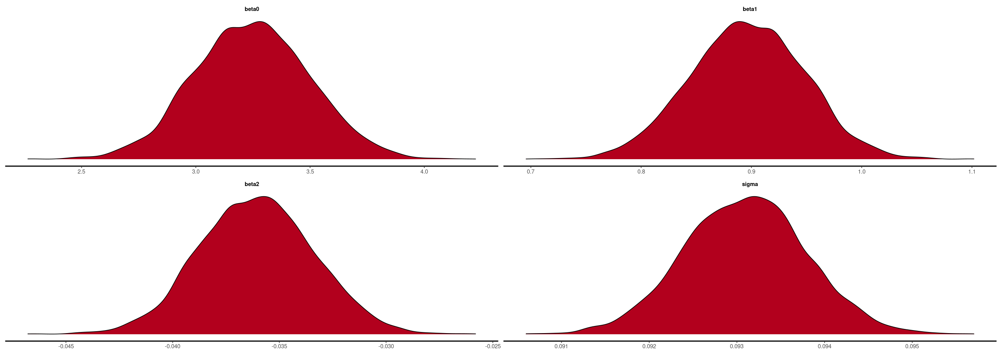

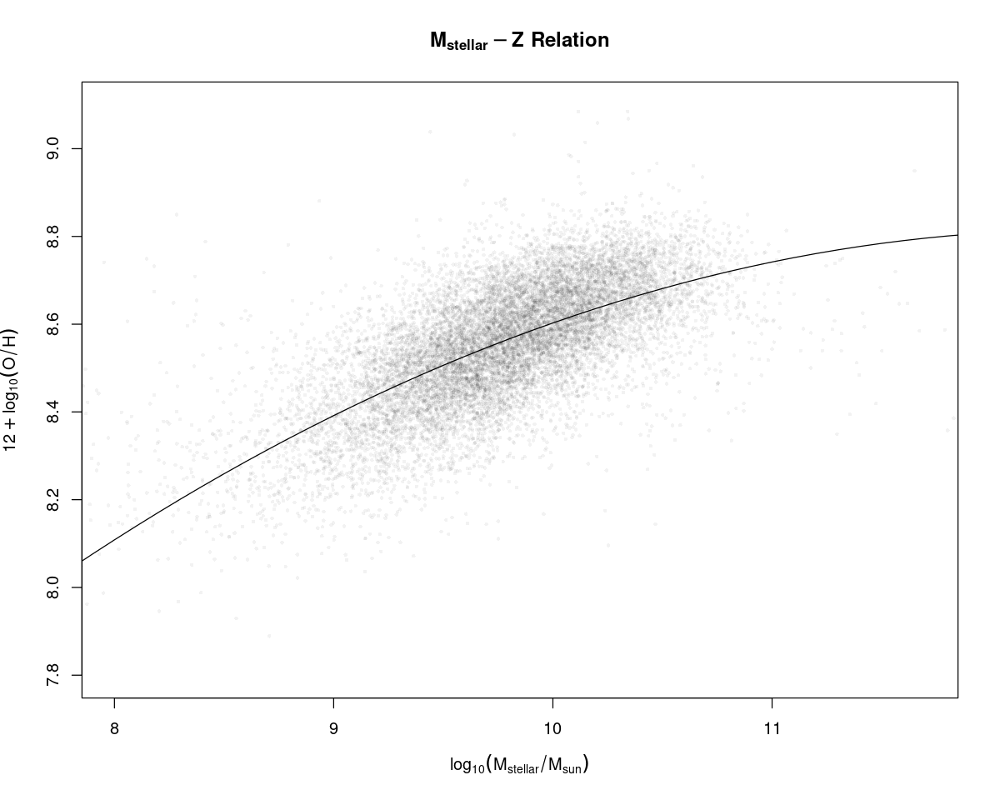

In [11]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------

# Black fit (GAMA)
fit_results_GAMAZ_black = readRDS('DataFrames_and_Tables/fit_results_GAMAZ_black.rds')
summary(fit_results_GAMAZ_black, par = c('beta0', 'beta1', 'beta2'))$summary

options(repr.plot.width = 22, repr.plot.height = 8)
stan_trace(fit_results_GAMAZ_black, par = c('beta0', 'beta1', 'beta2', 'sigma'))
stan_dens(fit_results_GAMAZ_black, par = c('beta0', 'beta1', 'beta2', 'sigma'))

a_Z_black = mean(as.numeric(as.numeric(extract(fit_results_GAMAZ_black)$beta0))) # 3.2458 
b_Z_black = mean(as.numeric(as.numeric(extract(fit_results_GAMAZ_black)$beta1))) # 0.8963
c_Z_black = mean(as.numeric(as.numeric(extract(fit_results_GAMAZ_black)$beta2))) # -0.0360 

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(7.8, 9.1)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(12 + log[10](O/H)))
title = expression(paste(bold(M[stellar]-Z~Relation)))

# Scatter Plots
options(repr.plot.width = 10, repr.plot.height = 8)
plot(data_GAMA$logmstar, data_GAMA$METALLICIY, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)

# Bayesian Fits
x_values = seq(-20, 20, by = 0.1)
polynomial = function(x, a, b, c) {
  return(a + b * x + c * x**2)
}

lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

## 4. Stan Model - Fitting Zero Points

Conocida las pendiente _beta1_ (llamada como `b_SFR_black` para la M-SFR Realtion) y las pendientes _beta1_ y _beta 2_ (llamada como `b_Z_black` y `c_Z_black` para la M-Z Relation), obtenida en la anterior sección, ya podemos hacer el ajuste al punto cero (fitting the zero-point) para las galaxias en filamentos/tendrils y voids con sus respectivas muestras control. Nótese que crearemos dos modelos de Stan: uno para ajustes bayesianos de primer orden (`stan_code_1st_order_zero_point` ,M_SFR Relation) y otro para ajustes bayesianos de tercer orden (`stan_code_2nd_order_zero_point`, M-Z Relation). 

Por otro lado, para agilizar el proceso y escribir menos código, creamos las funciones `bayesian_fit_1st_order_zero_point` y `bayesian_fit_2nd_order_zero_point` que llaman al modelo de Stan, lo ejecutan y muestran el diagnóstico. 

In [12]:
# Stan Model Fitting Zero Point with errors: 1st order
stan_code_1st_order_zero_point = '
data {
    int<lower=0> N;
    vector[N] obsx;
    vector[N] obsy;
    vector<lower=0>[N] errx;
    vector<lower=0>[N] erry;
    real beta1;
}

parameters {
    real beta0;
    real<lower=0> sigma;
    vector[N] xreal;
    vector[N] yreal;
}

model {
    xreal ~ normal(0.,10.);
    obsx ~ normal(xreal, errx);
    yreal ~ normal(beta0 + beta1 * xreal, sigma);
    obsy ~ normal(yreal, erry);
    beta0 ~ normal(0., 10.);
    sigma ~ cauchy(0., 10.);
}
'

# Call to the model
stan_model_1st_order_zero_point = stan_model(model_code = stan_code_1st_order_zero_point)

# Función ajuste bayesiano  (orden 1)
bayesian_fit_1st_order_zero_point = function(x_data, y_data, b1){
    
    # Data
    data_list = list(N = length(x), obsx = x, obsy = y, errx = errx, erry = erry, beta1 = b1) 
    
    # Bayesian Fit
    fit = sampling(stan_model_1st_order_zero_point, data = data_list, cores = 8)
    posterior_samples = extract(fit)

    # Analysis plots
    resumen = summary(fit, pars = c('beta0', 'sigma'))
    print(resumen$summary)
    
    options(repr.plot.width = 16, repr.plot.height = 5)
    print(stan_trace(fit, pars = c('beta0', 'sigma')))
    print(stan_dens(fit, pars = c('beta0', 'sigma')))

    #objeto = as.shinystan(fit)
    #launch_shinystan(objeto)

    # Parámetros del ajuste
    a = mean(posterior_samples$beta0)
    b = b1
    
    return(c(a,b,fit))
}

In [13]:
# Stan Model Fitting Zero Point with errors: 2nd order
stan_code_2nd_order_zero_point = '
data {
    int<lower=0> N;
    vector[N] obsx;
    vector[N] obsy;
    vector<lower=0>[N] errx;
    vector<lower=0>[N] erry;
    real beta1;
    real beta2;
}

parameters {
    real beta0;
    real<lower=0> sigma;
    vector[N] xreal;
    vector[N] yreal;
}

model {
    xreal ~ normal(0.,100.);
    obsx ~ normal(xreal, errx);
    yreal ~ normal(beta0 + beta1 * xreal + beta2 * xreal.^2, sigma);
    obsy ~ normal(yreal, erry);
    beta0 ~ normal(0., 100.);
    sigma ~ cauchy(0., 100.);
}
'

# Call to the model
stan_model_2nd_order_zero_point = stan_model(model_code = stan_code_2nd_order_zero_point)

# Función ajuste bayesiano  (orden 1)
bayesian_fit_2nd_order_zero_point = function(x, y, errx, erry, beta1, beta2){

    # Data for RStan Model
    N = length(y)  # número de observaciones

    data_list = list(N = N, obsx = x, obsy = y, errx = errx, erry = erry, beta1 = beta1, beta2 = beta2)
    
    # Fit RStan Model
    fit = sampling(stan_model_2nd_order_zero_point, data = data_list, cores = 8, chains = 4, iter = 2000)
    posterior_samples = extract(fit)
    
    # Print Results
    parametros_interes = c('beta0', 'sigma')
    resumen = summary(fit, pars = parametros_interes)
    
    print(resumen$summary)
    
    options(repr.plot.width = 16, repr.plot.height = 6)
    print(stan_trace(fit, pars = parametros_interes))
    print(stan_dens(fit, pars = parametros_interes))

    # Parámetros del ajuste
    a = mean(posterior_samples$beta0)
    b = beta1
    c = beta2
    
    return (c(a,b,c,fit,posterior_samples))
}

### 4.1. M-SFR Relations

#### Filaments


            mean      se_mean         sd       2.5%        25%        50%
beta0 -6.8221041 0.0004559407 0.03032444 -6.8822631 -6.8418749 -6.8224190
sigma  0.3760888 0.0005848815 0.02510714  0.3291264  0.3592031  0.3746413
            75%      97.5%    n_eff      Rhat
beta0 -6.801331 -6.7646485 4423.529 0.9999687
sigma  0.392644  0.4268633 1842.717 1.0014894


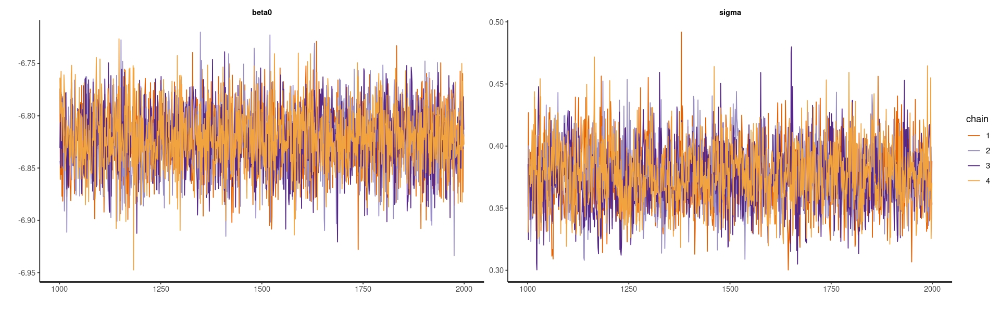

            mean      se_mean         sd       2.5%        25%        50%
beta0 -7.0459686 0.0004253209 0.02000428 -7.0853595 -7.0595254 -7.0458971
sigma  0.4145671 0.0004967622 0.01791798  0.3814947  0.4020589  0.4138339
             75%      97.5%    n_eff     Rhat
beta0 -7.0326105 -7.0062281 2212.140 1.000510
sigma  0.4263586  0.4516505 1301.011 1.003323


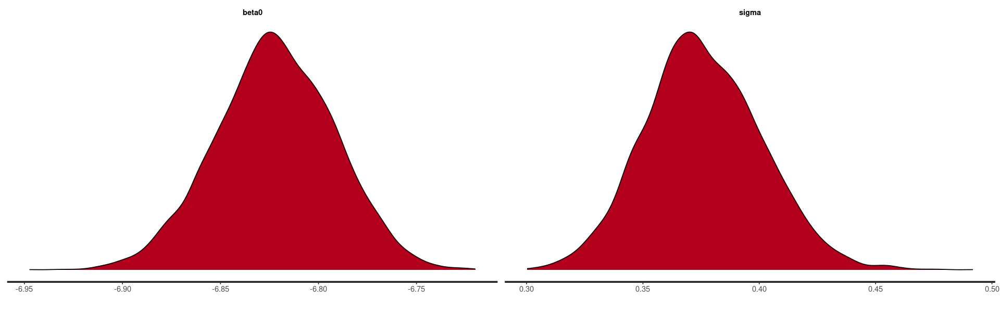

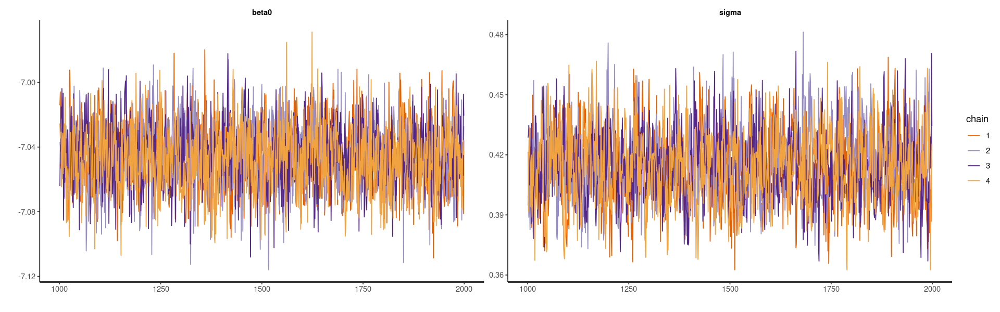

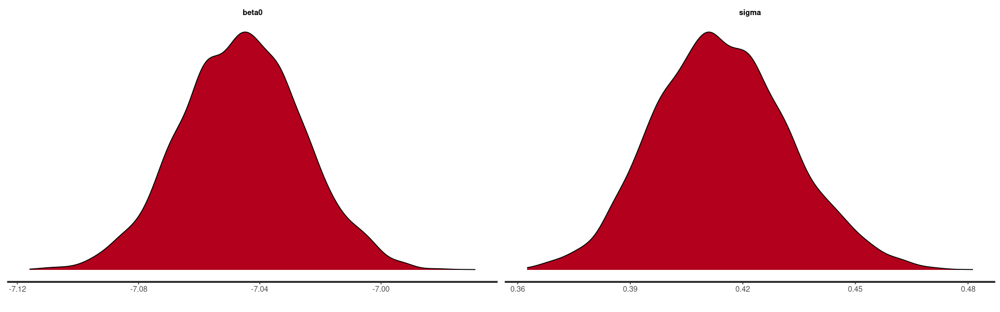

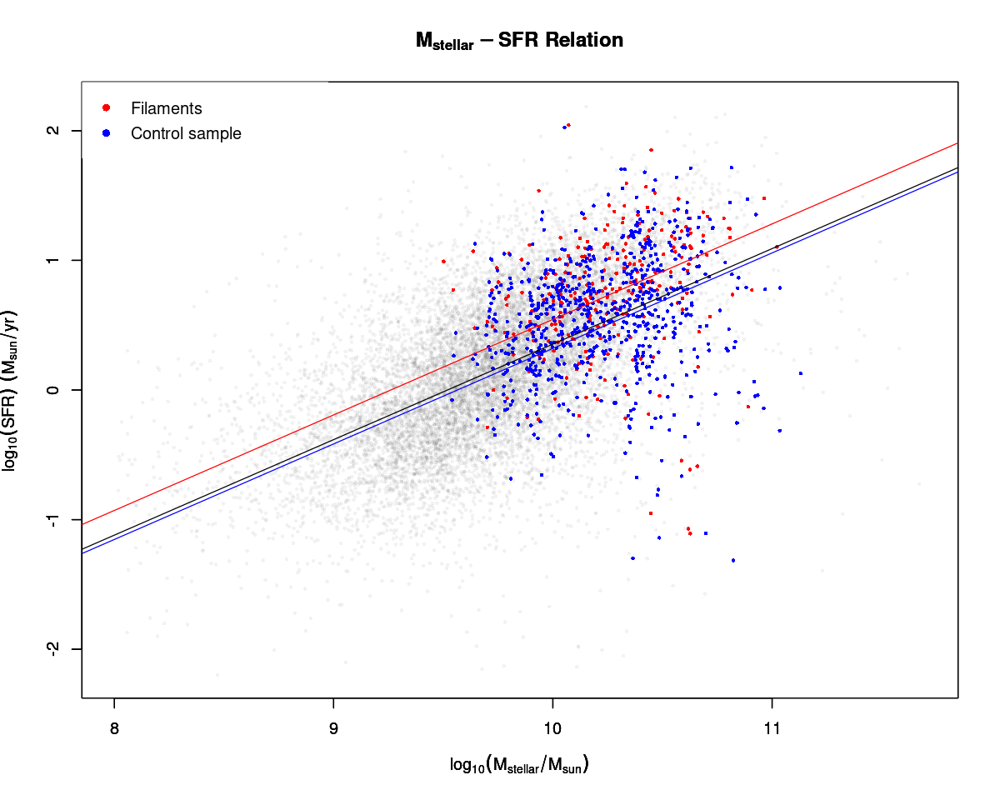

In [14]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------
# Red fit (filaments)
x_data = data_fil$logmstar_fil
y_data = data_fil$logSFR_fil
errx_data = data_fil$e_logmstar_fil
erry_data = data_fil$e_logSFR_fil

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_filSFR_redZP = bayesian_fit_1st_order_zero_point(x, y, b_SFR_black)

a_filSFR_redZP = as.numeric(fit_results_filSFR_redZP[1])
b_filSFR_redZP = as.numeric(fit_results_filSFR_redZP[2])

# Blue fit (clones)
x_data = data_filclone$logmstar_filclone
y_data = data_filclone$logSFR_filclone
errx_data = data_filclone$e_logmstar_filclone
erry_data = data_filclone$e_logSFR_filclone

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_filSFR_blueZP = bayesian_fit_1st_order_zero_point(x, y, b_SFR_black)

a_filSFR_blueZP = as.numeric(fit_results_filSFR_blueZP[1])
b_filSFR_blueZP = as.numeric(fit_results_filSFR_blueZP[2])

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(-2.2, 2.2)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(log[10](SFR)~(M[sun]/yr)))
title = expression(paste(bold(M[stellar]-SFR~Relation)))

# Scatter Plots
plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_fil$logmstar_fil, data_fil$logSFR_fil, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_filclone$logmstar_filclone, data_filclone$logSFR_filclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

# Bayesian Fits
options(repr.plot.width = 10, repr.plot.height = 8)
abline(a = a_filSFR_redZP, b = b_filSFR_redZP, col = "red")
abline(a = a_filSFR_blueZP, b = b_filSFR_blueZP, col = "blue")
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

legend('topleft', legend=c('Filaments', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

In [15]:
cat('La diferencia en coeficientes es de ', round(a_filSFR_redZP - a_filSFR_blueZP,4))

La diferencia en coeficientes es de  0.2239

#### Tendrils

           mean      se_mean         sd      2.5%       25%       50%       75%
beta0 -6.939111 0.0004377179 0.03775811 -7.012019 -6.963776 -6.939393 -6.913058
sigma  1.372411 0.0003557641 0.02836016  1.317039  1.353785  1.371507  1.391015
          97.5%    n_eff      Rhat
beta0 -6.864863 7441.007 0.9995002
sigma  1.429871 6354.670 0.9995248


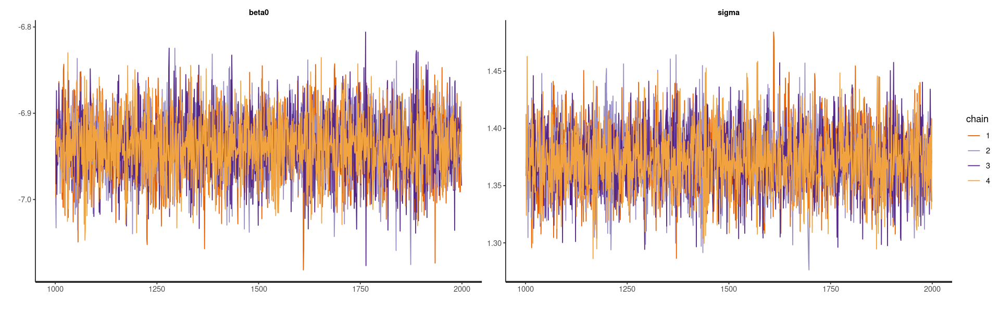

           mean      se_mean         sd      2.5%       25%       50%      75%
beta0 -7.002726 0.0004717568 0.03176338 -7.065532 -7.024001 -7.002321 -6.98087
sigma  1.145265 0.0003430968 0.02332163  1.100811  1.129139  1.145576  1.16116
          97.5%    n_eff      Rhat
beta0 -6.942643 4533.328 1.0003916
sigma  1.191020 4620.454 0.9997957


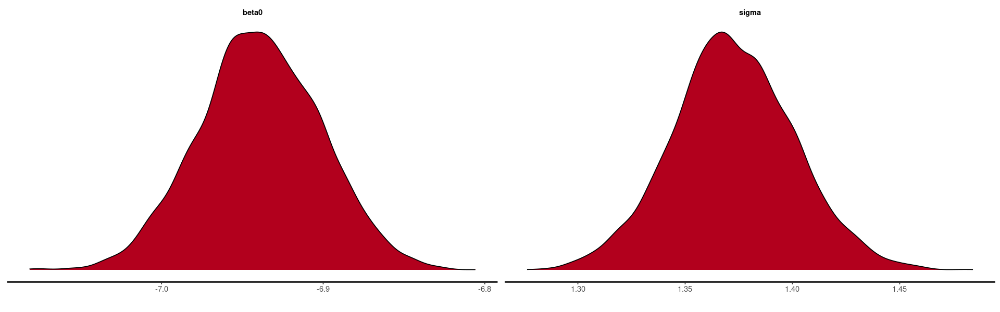

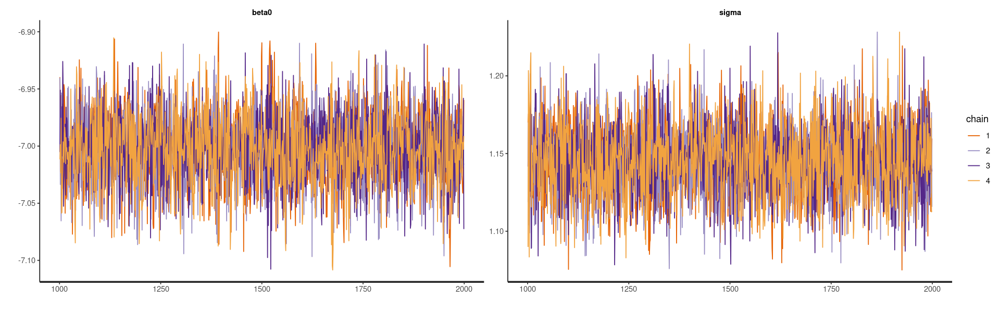

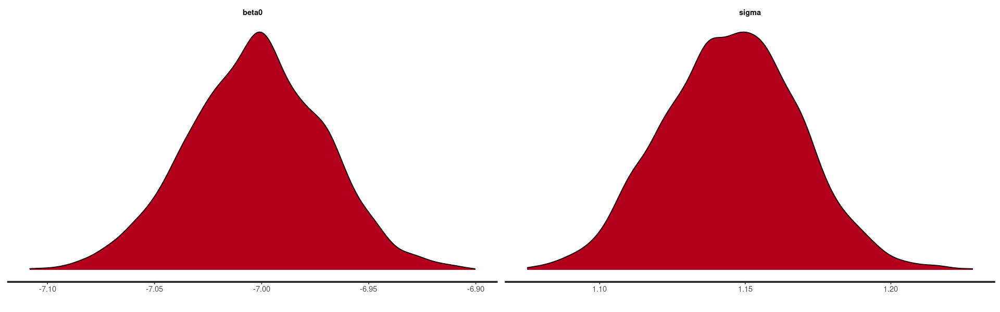

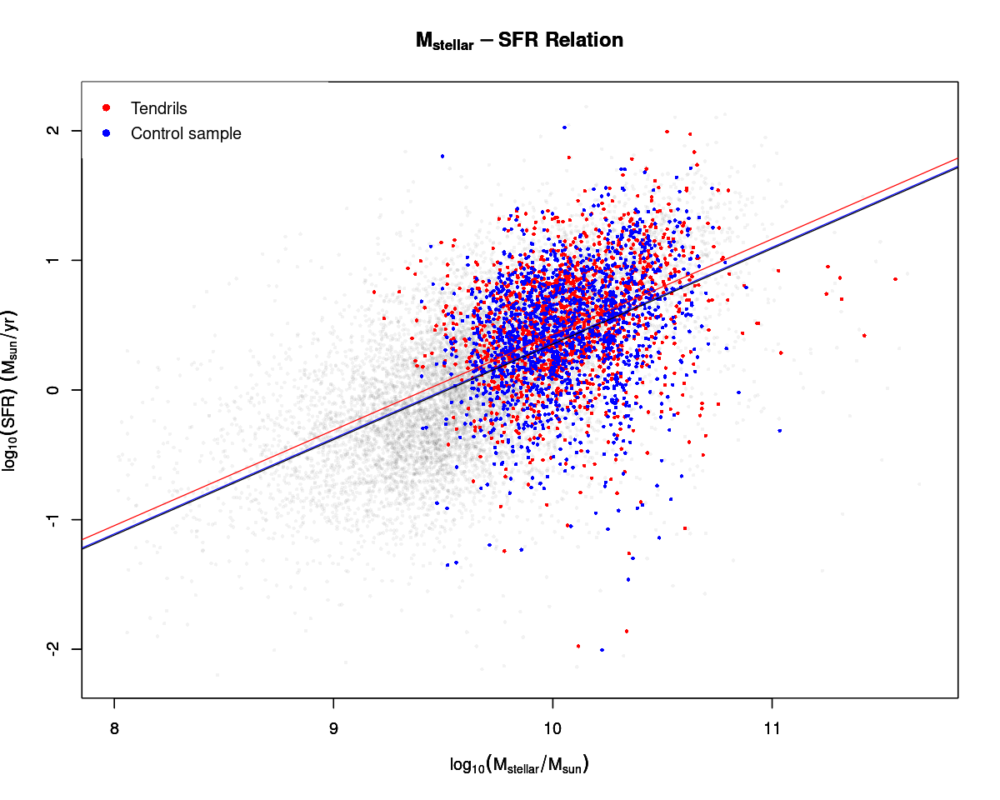

In [16]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------
# Red fit (tendril)
x_data = data_tendril$logmstar_tendril
y_data = data_tendril$logSFR_tendril
errx_data = data_tendril$e_logmstar_tendril
erry_data = data_tendril$e_logSFR_tendril

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_tendrilSFR_redZP = bayesian_fit_1st_order_zero_point(x, y, b_SFR_black)

a_tendrilSFR_redZP = as.numeric(fit_results_tendrilSFR_redZP[1])
b_tendrilSFR_redZP = as.numeric(fit_results_tendrilSFR_redZP[2])

# Blue fit (clones)
x_data = data_tendrilclone$logmstar_tendrilclone
y_data = data_tendrilclone$logSFR_tendrilclone
errx_data = data_tendrilclone$e_logmstar_tendrilclone
erry_data = data_tendrilclone$e_logSFR_tendrilclone

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_tendrilSFR_blueZP = bayesian_fit_1st_order_zero_point(x, y, b_SFR_black)

a_tendrilSFR_blueZP = as.numeric(fit_results_tendrilSFR_blueZP[1])
b_tendrilSFR_blueZP = as.numeric(fit_results_tendrilSFR_blueZP[2])

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(-2.2, 2.2)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(log[10](SFR)~(M[sun]/yr)))
title = expression(paste(bold(M[stellar]-SFR~Relation)))

# Scatter Plots
plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_tendril$logmstar_tendril, data_tendril$logSFR_tendril, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_tendrilclone$logmstar_tendrilclone, data_tendrilclone$logSFR_tendrilclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

# Bayesian Fits
options(repr.plot.width = 10, repr.plot.height = 8)
abline(a = a_tendrilSFR_redZP, b = b_tendrilSFR_redZP, col = "red")
abline(a = a_tendrilSFR_blueZP, b = b_tendrilSFR_blueZP, col = "blue")
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

legend('topleft', legend=c('Tendrils', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

In [17]:
cat('La diferencia en coeficientes es de ', round(a_tendrilSFR_redZP - a_tendrilSFR_blueZP,4))

La diferencia en coeficientes es de  0.0636

#### Voids

           mean      se_mean         sd       2.5%        25%        50%
beta0 -6.898097 0.0005829335 0.03853619 -6.9728734 -6.9243852 -6.8981635
sigma  0.405506 0.0006171822 0.03126454  0.3493293  0.3833447  0.4041958
             75%      97.5%    n_eff      Rhat
beta0 -6.8721444 -6.8221241 4370.183 0.9996643
sigma  0.4256757  0.4722927 2566.123 1.0001785


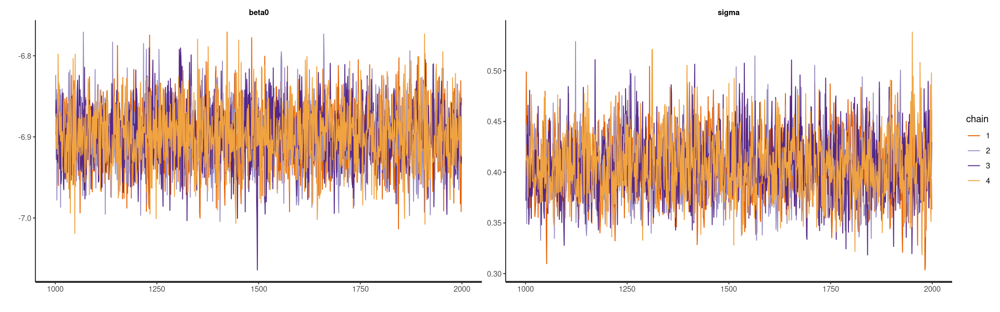

           mean      se_mean         sd      2.5%       25%       50%       75%
beta0 -7.010763 0.0004295321 0.03735556 -7.083871 -7.036235 -7.011404 -6.985300
sigma  1.341702 0.0003538319 0.02770357  1.289594  1.322758  1.341053  1.360576
          97.5%    n_eff      Rhat
beta0 -6.937008 7563.438 0.9992690
sigma  1.396273 6130.238 0.9997777


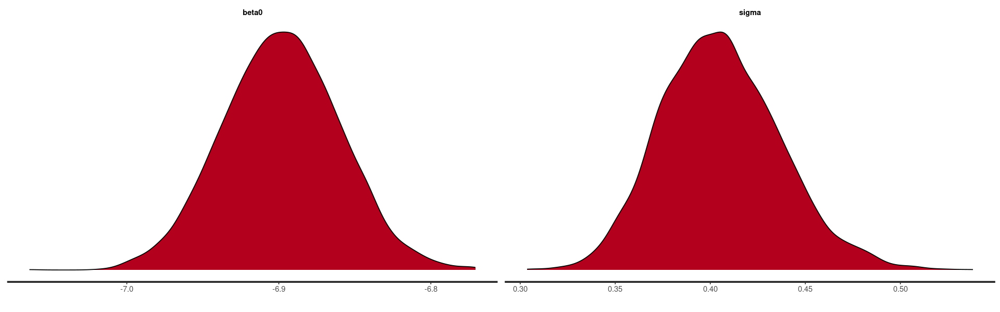

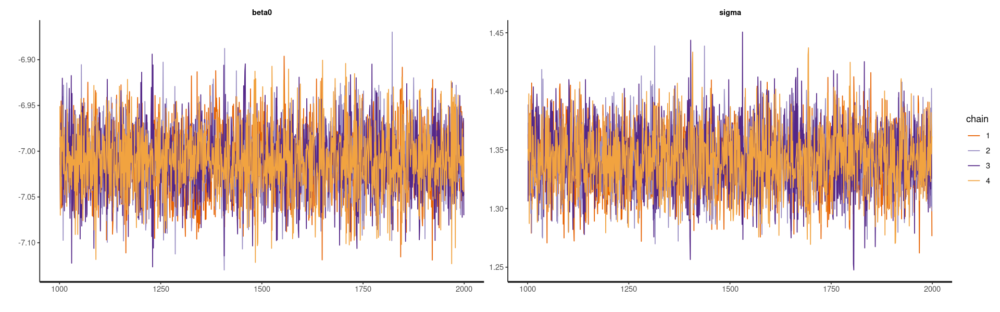

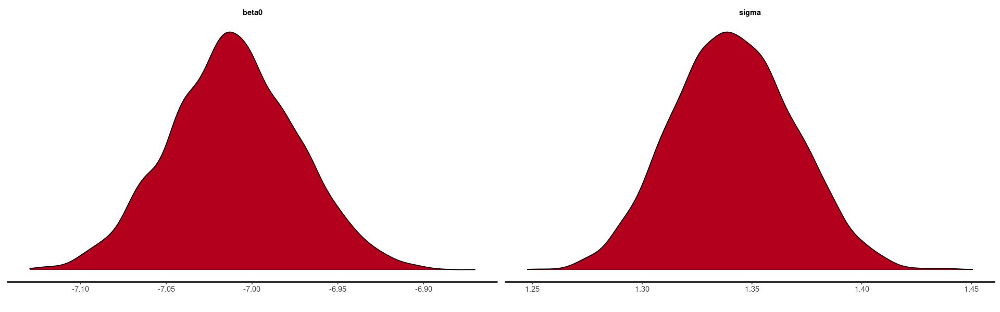

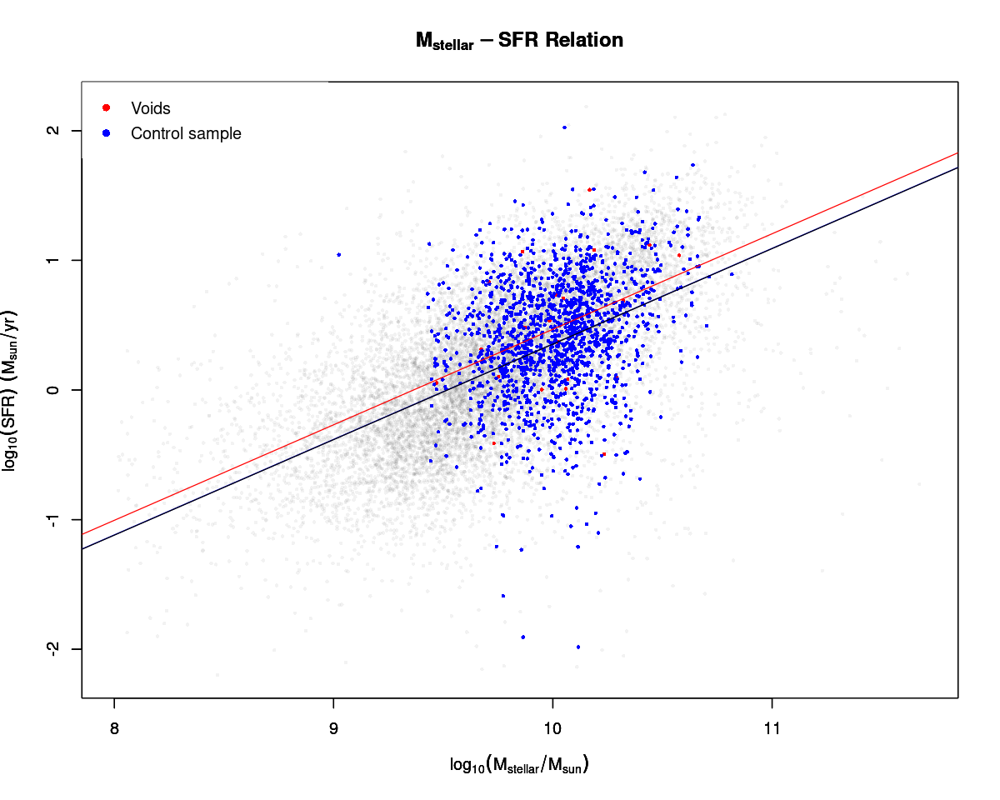

In [18]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------
# Red fit (void)
x_data = data_void$logmstar_void
y_data = data_void$logSFR_void
errx_data = data_void$e_logmstar_void
erry_data = data_void$e_logSFR_void

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_voidSFR_redZP = bayesian_fit_1st_order_zero_point(x, y, b_SFR_black)

a_voidSFR_redZP = as.numeric(fit_results_voidSFR_redZP[1])
b_voidSFR_redZP = as.numeric(fit_results_voidSFR_redZP[2])

# Blue fit (clones)
x_data = data_voidclone$logmstar_voidclone
y_data = data_voidclone$logSFR_voidclone
errx_data = data_voidclone$e_logmstar_voidclone
erry_data = data_voidclone$e_logSFR_voidclone

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_voidSFR_blueZP = bayesian_fit_1st_order_zero_point(x, y, b_SFR_black)

a_voidSFR_blueZP = as.numeric(fit_results_voidSFR_blueZP[1])
b_voidSFR_blueZP = as.numeric(fit_results_voidSFR_blueZP[2])

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(-2.2, 2.2)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(log[10](SFR)~(M[sun]/yr)))
title = expression(paste(bold(M[stellar]-SFR~Relation)))

# Scatter Plots
plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_void$logmstar_void, data_void$logSFR_void, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_voidclone$logmstar_voidclone, data_voidclone$logSFR_voidclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

# Bayesian Fits
options(repr.plot.width = 10, repr.plot.height = 8)
abline(a = a_voidSFR_redZP, b = b_voidSFR_redZP, col = "red")
abline(a = a_voidSFR_blueZP, b = b_voidSFR_blueZP, col = "blue")
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

legend('topleft', legend=c('Voids', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

In [19]:
cat('La diferencia en coeficientes es de ', round(a_voidSFR_redZP - a_voidSFR_blueZP,4))

La diferencia en coeficientes es de  0.1127

### 4.2. M-Z Relation

#### Filaments

            mean      se_mean          sd       2.5%        25%        50%
beta0 3.25797391 6.310493e-05 0.005456716 3.24712926 3.25434630 3.25800023
sigma 0.08101373 7.033277e-05 0.004422698 0.07294045 0.07790784 0.08085489
             75%      97.5%    n_eff      Rhat
beta0 3.26160833 3.26882480 7477.149 0.9994576
sigma 0.08387478 0.09011511 3954.205 0.9994779


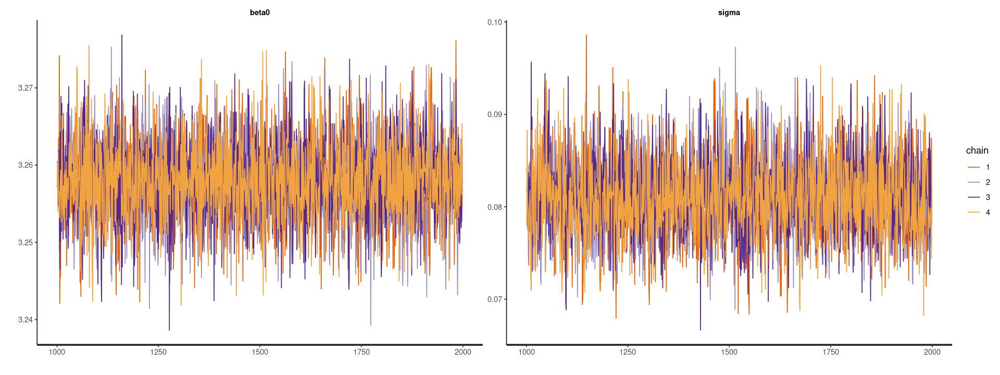

            mean      se_mean          sd       2.5%        25%        50%
beta0 3.25307059 4.890729e-05 0.003819601 3.24557606 3.25049325 3.25303489
sigma 0.09589155 4.453569e-05 0.003247678 0.08974079 0.09363949 0.09583128
             75%     97.5%    n_eff      Rhat
beta0 3.25560544 3.2606131 6099.423 0.9999227
sigma 0.09808552 0.1023508 5317.769 1.0005625


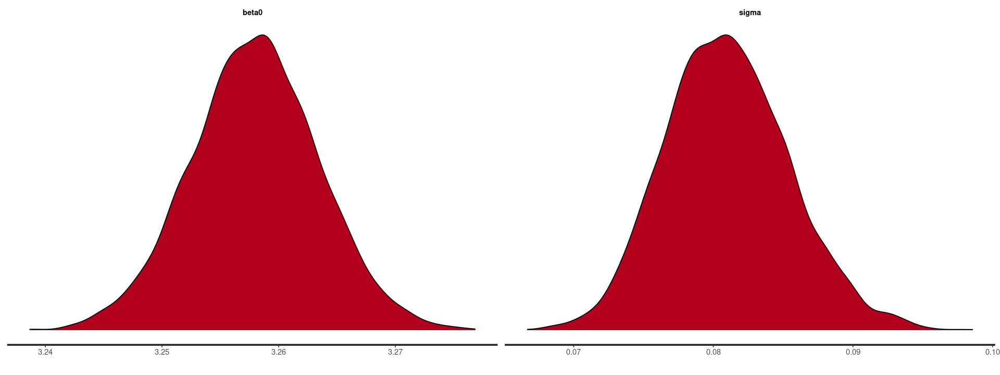

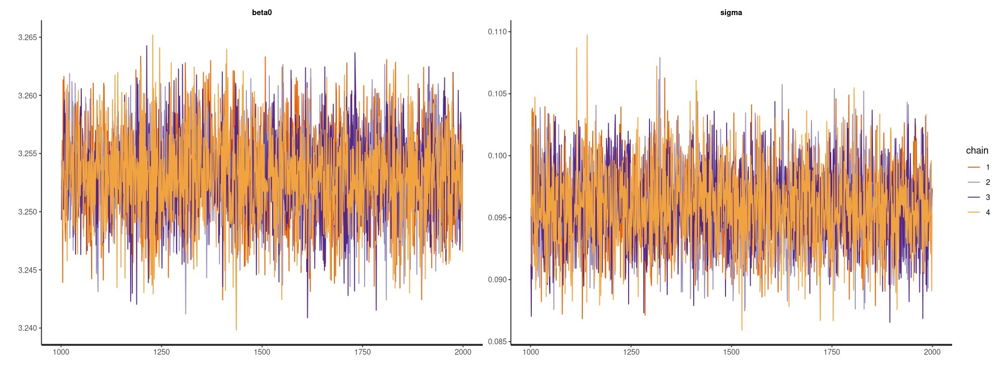

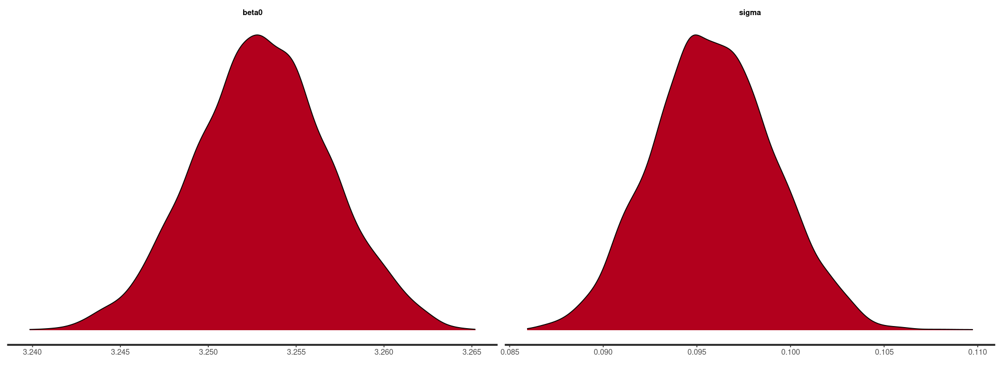

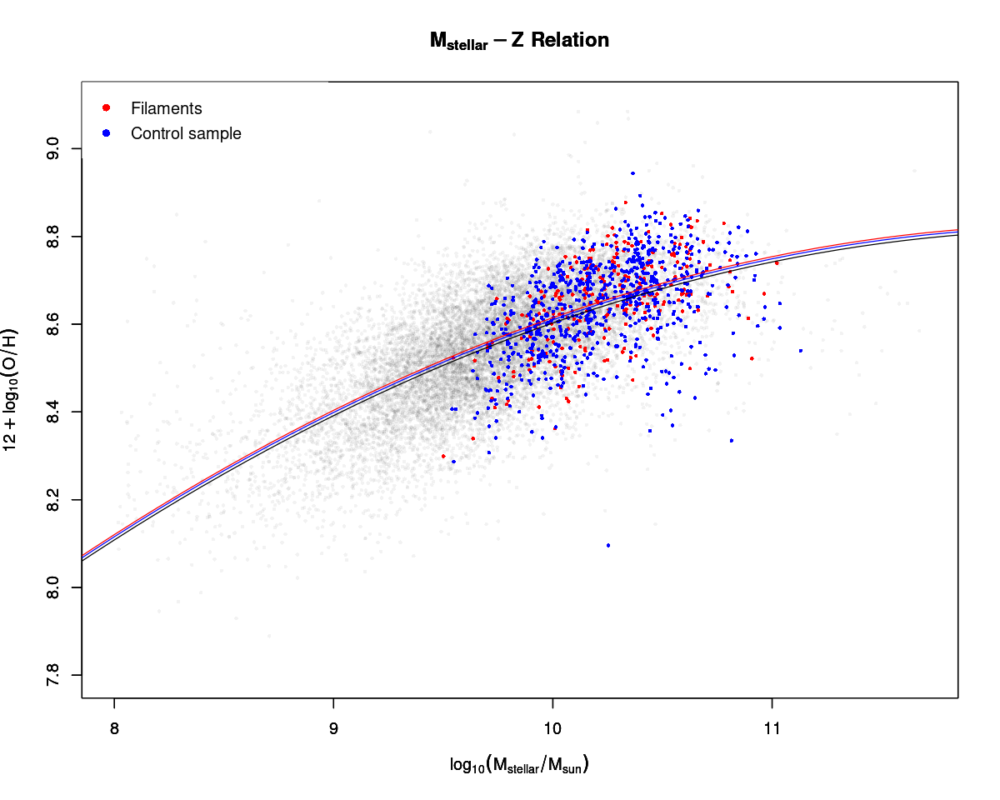

In [20]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------
# Red fit (filaments)
x_data = data_fil$logmstar_fil
y_data = data_fil$METALLICIY_fil
errx_data = data_fil$e_logmstar_fil
erry_data = data_fil$e_METALLICIY_fil

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_filZ_redZP = bayesian_fit_2nd_order_zero_point(x, y, errx, erry, b_Z_black, c_Z_black)

a_filZ_redZP = as.numeric(fit_results_filZ_redZP[1])
b_filZ_redZP = as.numeric(fit_results_filZ_redZP[2])
c_filZ_redZP = as.numeric(fit_results_filZ_redZP[3])

# Blue fit (clones)
x_data = data_filclone$logmstar_filclone
y_data = data_filclone$METALLICIY_filclone
errx_data = data_filclone$e_logmstar_filclone
erry_data = data_filclone$e_METALLICIY_filclone

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_filZ_blueZP = bayesian_fit_2nd_order_zero_point(x, y, errx, erry, b_Z_black, c_Z_black)

a_filZ_blueZP = as.numeric(fit_results_filZ_blueZP[1])
b_filZ_blueZP = as.numeric(fit_results_filZ_blueZP[2])
c_filZ_blueZP = as.numeric(fit_results_filZ_blueZP[3])

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(7.8, 9.1)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(12+log[10](O/H)))
title = expression(paste(bold(M[stellar]-Z~Relation)))

# Scatter Plots
options(repr.plot.width = 10, repr.plot.height = 8)
plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_fil$logmstar_fil, data_fil$METALLICIY_fil, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_filclone$logmstar_filclone, data_filclone$METALLICIY_filclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

# Bayesian Fits
x_values = seq(-20, 20, by = 0.1)
polynomial = function(x, a, b, c) {
  return(a + b * x + c * x**2)
}

lines(x_values, polynomial(x_values, a_filZ_redZP, b_filZ_redZP, c_filZ_redZP), type = "l", col = "red", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_filZ_blueZP, b_filZ_blueZP, c_filZ_blueZP), type = "l", col = "blue", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

legend('topleft', legend=c('Filaments', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

In [21]:
cat('La diferencia en coeficientes es de ', round(a_filZ_redZP - a_filZ_blueZP,4))

La diferencia en coeficientes es de  0.0049

#### Tendrils

          mean      se_mean          sd      2.5%       25%      50%       75%
beta0 3.261336 4.670136e-05 0.004595550 3.2523290 3.2582611 3.261393 3.2644253
sigma 0.169665 3.905533e-05 0.003439527 0.1630288 0.1673553 0.169543 0.1719663
          97.5%    n_eff      Rhat
beta0 3.2705135 9683.135 0.9993483
sigma 0.1767534 7755.983 0.9997912


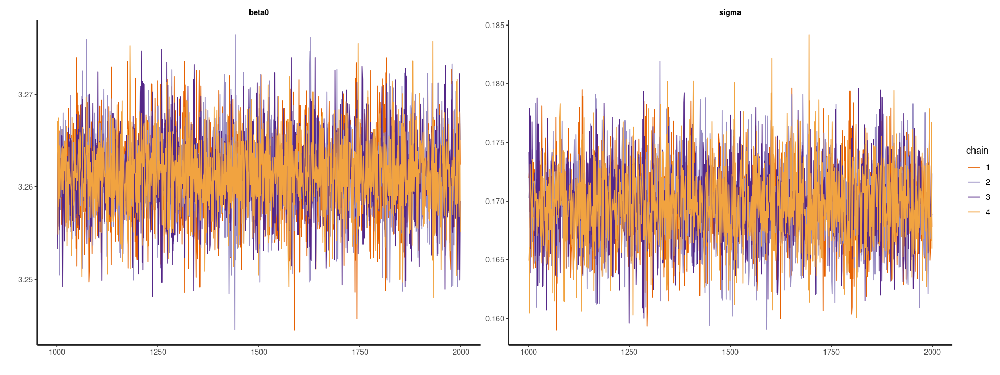

           mean      se_mean          sd      2.5%      25%       50%       75%
beta0 3.2660661 4.490690e-05 0.003453167 3.2592491 3.263680 3.2660541 3.2684270
sigma 0.1276059 3.571121e-05 0.002781488 0.1222838 0.125724 0.1275613 0.1294536
          97.5%    n_eff      Rhat
beta0 3.2728611 5913.016 0.9994788
sigma 0.1331103 6066.599 1.0001426


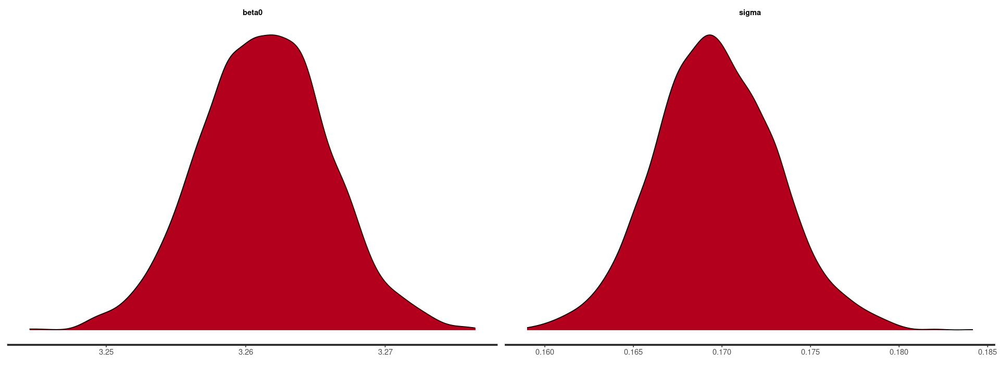

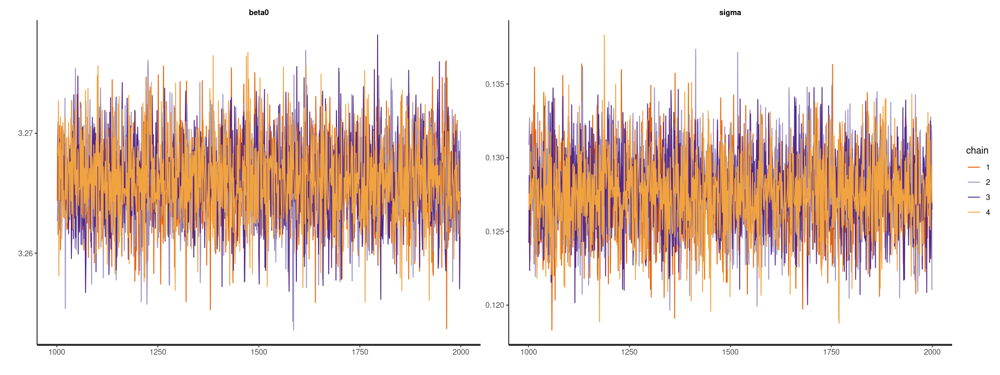

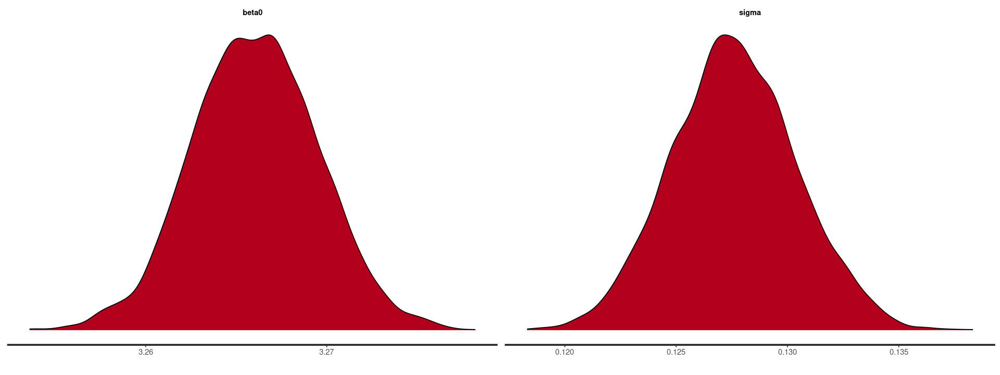

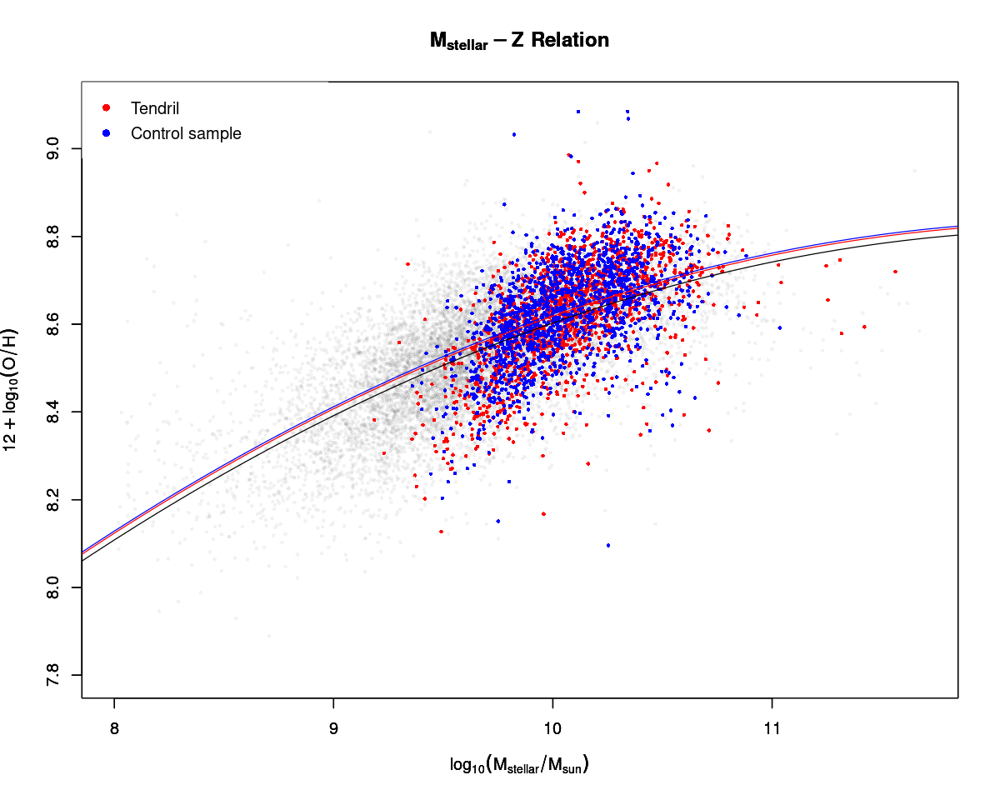

In [22]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------
# Red fit (Tendrils)
x_data = data_tendril$logmstar_tendril
y_data = data_tendril$METALLICIY_tendril
errx_data = data_tendril$e_logmstar_tendril
erry_data = data_tendril$e_METALLICIY_tendril

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_tendrilZ_redZP = bayesian_fit_2nd_order_zero_point(x, y, errx, erry, b_Z_black, c_Z_black)

a_tendrilZ_redZP = as.numeric(fit_results_tendrilZ_redZP[1])
b_tendrilZ_redZP = as.numeric(fit_results_tendrilZ_redZP[2])
c_tendrilZ_redZP = as.numeric(fit_results_tendrilZ_redZP[3])

# Blue fit (clones)
x_data = data_tendrilclone$logmstar_tendrilclone
y_data = data_tendrilclone$METALLICIY_tendrilclone
errx_data = data_tendrilclone$e_logmstar_tendrilclone
erry_data = data_tendrilclone$e_METALLICIY_tendrilclone

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_tendrilZ_blueZP = bayesian_fit_2nd_order_zero_point(x, y, errx, erry, b_Z_black, c_Z_black)

a_tendrilZ_blueZP = as.numeric(fit_results_tendrilZ_blueZP[1])
b_tendrilZ_blueZP = as.numeric(fit_results_tendrilZ_blueZP[2])
c_tendrilZ_blueZP = as.numeric(fit_results_tendrilZ_blueZP[3])

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(7.8, 9.1)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(12+log[10](O/H)))
title = expression(paste(bold(M[stellar]-Z~Relation)))

# Scatter Plots
options(repr.plot.width = 10, repr.plot.height = 8)
plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_tendril$logmstar_tendril, data_tendril$METALLICIY_tendril, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_tendrilclone$logmstar_tendrilclone, data_tendrilclone$METALLICIY_tendrilclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

# Bayesian Fits
x_values = seq(-20, 20, by = 0.1)
polynomial = function(x, a, b, c) {
  return(a + b * x + c * x**2)
}

lines(x_values, polynomial(x_values, a_tendrilZ_redZP, b_tendrilZ_redZP, c_tendrilZ_redZP), type = "l", col = "red", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_tendrilZ_blueZP, b_tendrilZ_blueZP, c_tendrilZ_blueZP), type = "l", col = "blue", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

legend('topleft', legend=c('Tendril', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

In [23]:
cat('La diferencia en coeficientes es de ', round(a_tendrilZ_redZP - a_tendrilZ_blueZP,4))

La diferencia en coeficientes es de  -0.0047

#### Voids

            mean      se_mean          sd       2.5%        25%        50%
beta0 3.24301700 8.831539e-05 0.007101250 3.22935017 3.23801073 3.24310408
sigma 0.08755218 8.758789e-05 0.005600901 0.07711933 0.08364072 0.08733048
             75%      97.5%    n_eff      Rhat
beta0 3.24793864 3.25666577 6465.421 0.9994586
sigma 0.09118963 0.09902025 4089.099 1.0000678


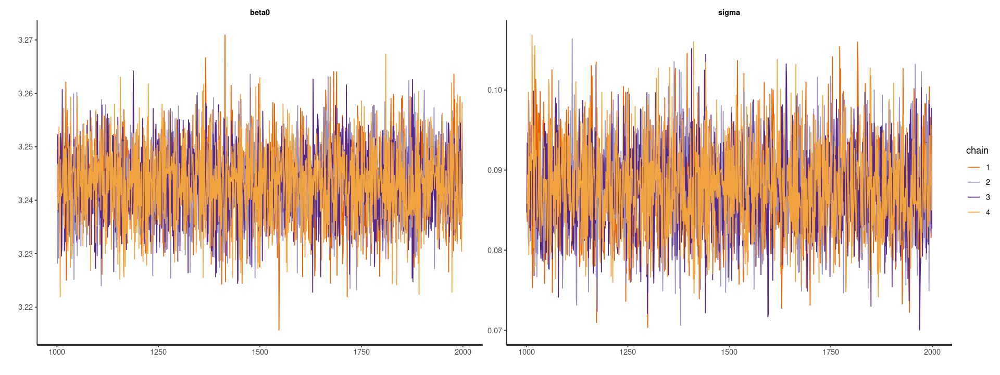

          mean      se_mean          sd      2.5%      25%       50%       75%
beta0 3.264501 6.226900e-05 0.004442427 3.2558693 3.261527 3.2643769 3.2675407
sigma 0.167507 4.800954e-05 0.003457166 0.1608081 0.165207 0.1674433 0.1698196
          97.5%    n_eff      Rhat
beta0 3.2732871 5089.755 0.9993353
sigma 0.1743244 5185.437 1.0001592


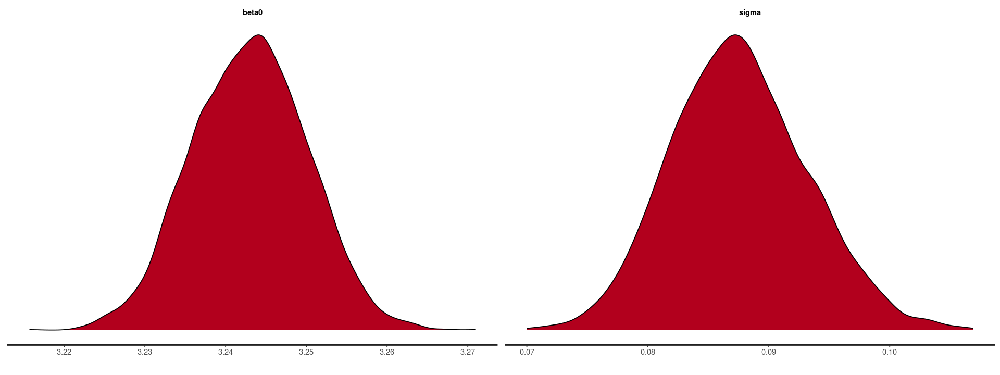

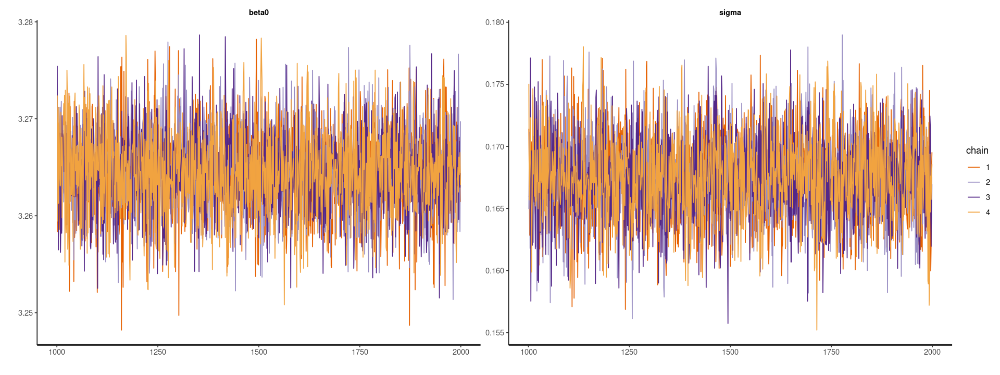

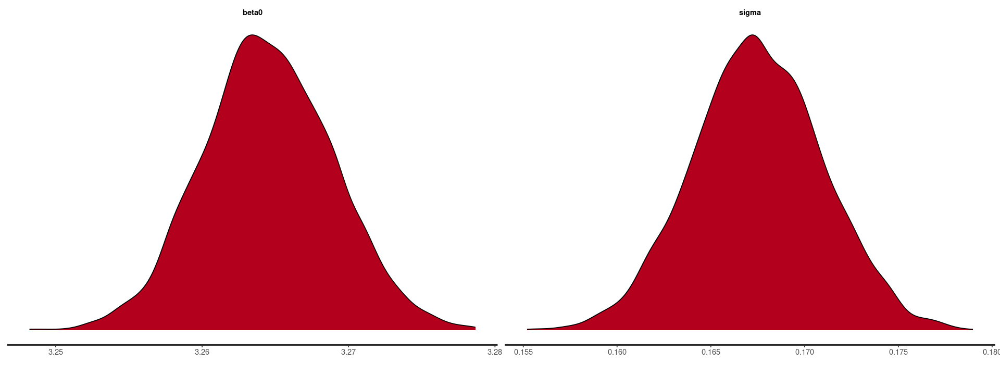

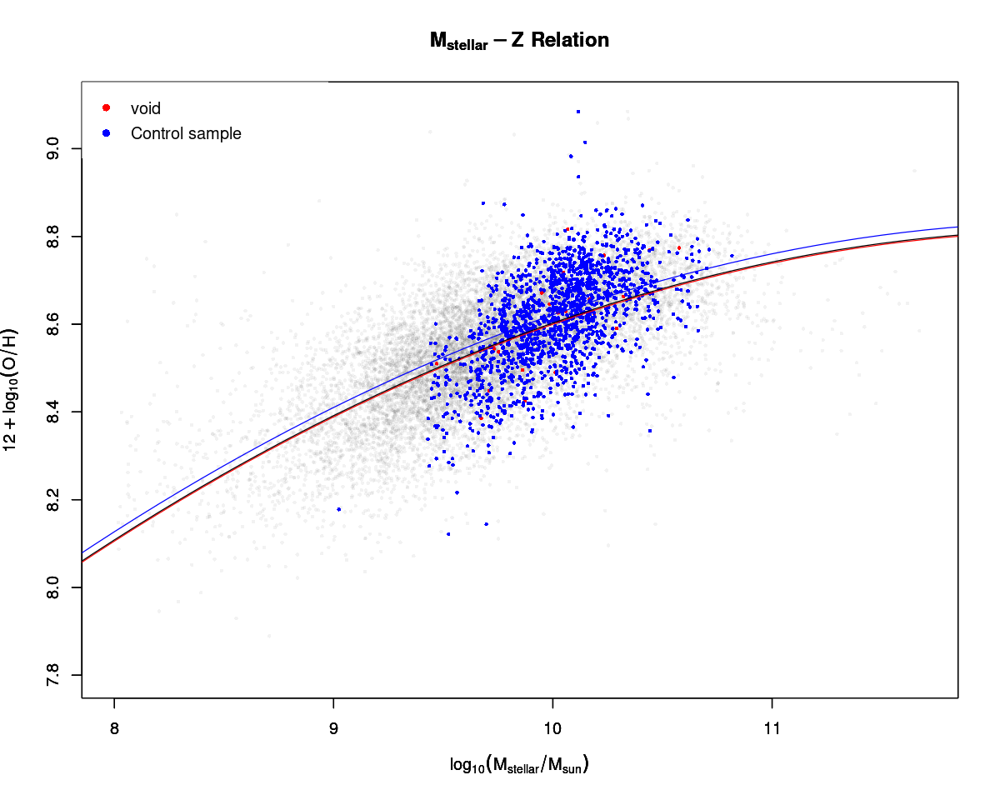

In [24]:
# BAYESIAN FIT (STAN) ---------------------------------------------------------------------------------------------------------------
# Red fit (Voids)
x_data = data_void$logmstar_void
y_data = data_void$METALLICIY_void
errx_data = data_void$e_logmstar_void
erry_data = data_void$e_METALLICIY_void

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_voidZ_redZP = bayesian_fit_2nd_order_zero_point(x, y, errx, erry, b_Z_black, c_Z_black)

a_voidZ_redZP = as.numeric(fit_results_voidZ_redZP[1])
b_voidZ_redZP = as.numeric(fit_results_voidZ_redZP[2])
c_voidZ_redZP = as.numeric(fit_results_voidZ_redZP[3])

# Blue fit (clones)
x_data = data_voidclone$logmstar_voidclone
y_data = data_voidclone$METALLICIY_voidclone
errx_data = data_voidclone$e_logmstar_voidclone
erry_data = data_voidclone$e_METALLICIY_voidclone

valid_idx = complete.cases(x_data, y_data) & is.finite(x_data) & is.finite(y_data)
x = x_data[valid_idx]
y = y_data[valid_idx]
errx = errx_data[valid_idx]; errx[errx < 1e-4] = 0.001
erry = erry_data[valid_idx]; erry[erry < 1e-4] = 0.001

fit_results_voidZ_blueZP = bayesian_fit_2nd_order_zero_point(x, y, errx, erry, b_Z_black, c_Z_black)

a_voidZ_blueZP = as.numeric(fit_results_voidZ_blueZP[1])
b_voidZ_blueZP = as.numeric(fit_results_voidZ_blueZP[2])
c_voidZ_blueZP = as.numeric(fit_results_voidZ_blueZP[3])

# PLOT ------------------------------------------------------------------------------------------------------------------------------

xlim = c(8, 11.7)
ylim = c(7.8, 9.1)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(12+log[10](O/H)))
title = expression(paste(bold(M[stellar]-Z~Relation)))

# Scatter Plots
options(repr.plot.width = 10, repr.plot.height = 8)
plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_void$logmstar_void, data_void$METALLICIY_void, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_voidclone$logmstar_voidclone, data_voidclone$METALLICIY_voidclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)

# Bayesian Fits
x_values = seq(-20, 20, by = 0.1)
polynomial = function(x, a, b, c) {
  return(a + b * x + c * x**2)
}

lines(x_values, polynomial(x_values, a_voidZ_redZP, b_voidZ_redZP, c_voidZ_redZP), type = "l", col = "red", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_voidZ_blueZP, b_voidZ_blueZP, c_voidZ_blueZP), type = "l", col = "blue", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

legend('topleft', legend=c('void', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

In [25]:
cat('La diferencia en coeficientes es de ', round(a_voidZ_redZP - a_voidZ_blueZP,4))

La diferencia en coeficientes es de  -0.0215

## 5. Resume Scale Relation Fits

En esta sección, recopilamos los ajustes bayesianos calculados. 

### 5.1. M-SFR Realtion

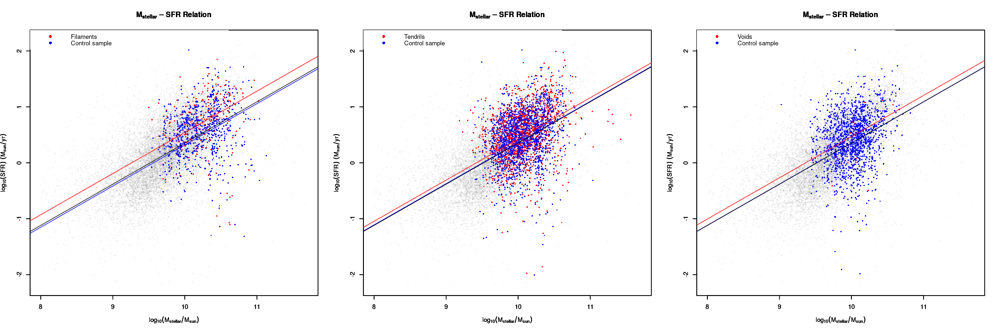

In [26]:
#pdf("Images/SFR_Relations_Bayesian.pdf")

par(mfrow = c(1, 3))
options(repr.plot.width = 18, repr.plot.height = 6)

xlim = c(8, 11.7)
ylim = c(-2.2, 2.2)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(log[10](SFR)~(M[sun]/yr)))
title = expression(paste(bold(M[stellar]-SFR~Relation)))

# PLOT -----------------------------------------------------------------------------------------------------------------------------------

plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_fil$logmstar_fil, data_fil$logSFR_fil, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_filclone$logmstar_filclone, data_filclone$logSFR_filclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)
abline(a = a_filSFR_redZP, b = b_filSFR_redZP, col = "red")
abline(a = a_filSFR_blueZP, b = b_filSFR_blueZP, col = "blue")
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

legend('topleft', legend=c('Filaments', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------

plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_tendril$logmstar_tendril, data_tendril$logSFR_tendril, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_tendrilclone$logmstar_tendrilclone, data_tendrilclone$logSFR_tendrilclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)
abline(a = a_tendrilSFR_redZP, b = b_tendrilSFR_redZP, col = "red")
abline(a = a_tendrilSFR_blueZP, b = b_tendrilSFR_blueZP, col = "blue")
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

legend('topleft', legend=c('Tendrils', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------

plot(data_GAMA$logmstar[maskSFR], data_GAMA$logSFR[maskSFR], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_void$logmstar_void, data_void$logSFR_void, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_voidclone$logmstar_voidclone, data_voidclone$logSFR_voidclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)
abline(a = a_voidSFR_redZP, b = b_voidSFR_redZP, col = "red")
abline(a = a_voidSFR_blueZP, b = b_voidSFR_blueZP, col = "blue")
abline(a = a_SFR_black, b = b_SFR_black, col = "black")

legend('topleft', legend=c('Voids', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# Save
#dev.off()

### 5.2. M-Z Relation

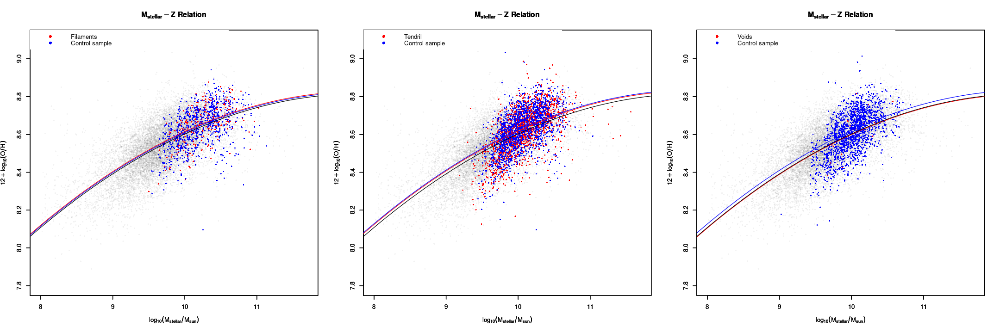

In [27]:
#pdf("Images/M_Z_Relations_Bayesian.pdf")

par(mfrow = c(1, 3))
options(repr.plot.width = 18, repr.plot.height = 6)

xlim = c(8,11.7)
ylim = c(7.8,9.1)

xlabel = expression(paste(log[10](M[stellar]/M[sun])))
ylabel = expression(paste(12+log[10](O/H)))
title = expression(paste(bold(M[stellar]-Z~Relation)))

# PLOT -----------------------------------------------------------------------------------------------------------------------------------

plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_fil$logmstar_fil, data_fil$METALLICIY_fil, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_filclone$logmstar_filclone, data_filclone$METALLICIY_filclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)
lines(x_values, polynomial(x_values, a_filZ_redZP, b_filZ_redZP, c_filZ_redZP), type = "l", col = "red", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_filZ_blueZP, b_filZ_blueZP, c_filZ_blueZP), type = "l", col = "blue", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

legend('topleft', legend=c('Filaments', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------

plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_tendril$logmstar_tendril, data_tendril$METALLICIY_tendril, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_tendrilclone$logmstar_tendrilclone, data_tendrilclone$METALLICIY_tendrilclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)
lines(x_values, polynomial(x_values, a_tendrilZ_redZP, b_tendrilZ_redZP, c_tendrilZ_redZP), type = "l", col = "red", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_tendrilZ_blueZP, b_tendrilZ_blueZP, c_tendrilZ_blueZP), type = "l", col = "blue", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

legend('topleft', legend=c('Tendril', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# PLOT -----------------------------------------------------------------------------------------------------------------------------------

plot(data_GAMA$logmstar[maskZ], data_GAMA$METALLICIY[maskZ], xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col=rgb(0, 0, 0, 0.05), cex=0.5); par(new=TRUE)
plot(data_void$logmstar_void, data_void$METALLICIY_void, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='red', cex=0.5); par(new=TRUE)
plot(data_voidclone$logmstar_voidclone, data_voidclone$METALLICIY_voidclone, xlim=xlim, ylim=ylim, xlab=xlabel, ylab=ylabel, main=title, pch=16, col='blue', cex=0.5)
lines(x_values, polynomial(x_values, a_voidZ_redZP, b_voidZ_redZP, c_voidZ_redZP), type = "l", col = "red", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_voidZ_blueZP, b_voidZ_blueZP, c_voidZ_blueZP), type = "l", col = "blue", xlab = "x", ylab = "y")
lines(x_values, polynomial(x_values, a_Z_black, b_Z_black, c_Z_black), type = "l", col = "black", xlab = "x", ylab = "y")

legend('topleft', legend=c('Voids', 'Control sample'), col=c("red", "blue"), pch=c(16,16), box.col="transparent")

# Save
#dev.off()

### 5.3 Coefficient plot

Resumimos los resultados (diferencias en los coeficientes con sus errores) en el siguiente plot llamado _Coefficient plot_.

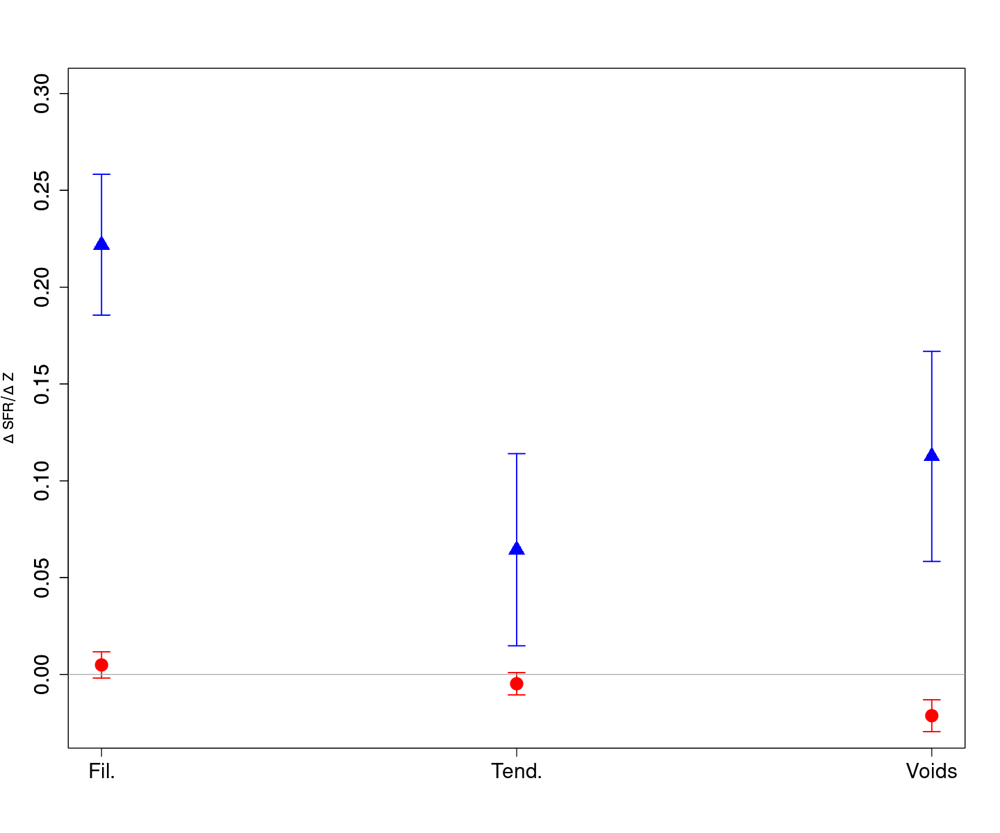

In [28]:
#pdf("Images/Coefficients_Bayesian.pdf")

# Data
galaxies = c('Fil.', 'Tend.', 'Voids')

coefSFR = c(0.2219, 
            0.0644, 
            0.1126)

coefZ = c(0.0049, 
          -0.0048, 
          -0.0213)

errors_SFR = c(sqrt(0.03058429**2 + 0.01967468**2), 
                sqrt(0.03816372**2 + 0.03168896**2), 
                sqrt(0.03864730**2 + 0.03802854**2))

errors_Z = c(sqrt(0.0055**2 + 0.00396**2), 
              sqrt(0.00458**2 + 0.00349**2), 
              sqrt(0.00687**2 + 0.00450**2))

# Plot
options(repr.plot.width = 12, repr.plot.height = 10)

plot(coefSFR, pch = 17, col = 'blue', ylim = c(-0.025, 0.3), xlab = '', ylab = expression(Delta~SFR / Delta~Z), xaxt = 'n', cex = 2, cex.axis = 1.5); par(new=TRUE)
plot(coefZ, pch = 19, col = 'red', ylim = c(-0.025, 0.3), xlab = '', ylab = expression(Delta~SFR / Delta~Z), xaxt = 'n', cex = 2, cex.axis = 1.5)

# Errorbars
arrows(x0 = 1:3, col = 'blue', y0 = coefSFR - errors_SFR, y1 = coefSFR + errors_SFR, angle = 90, code = 3, length = 0.1, lwd = 1.5)
arrows(x0 = 1:3, col = 'red', y0 = coefZ - errors_Z, y1 = coefZ + errors_Z, angle = 90, code = 3, length = 0.1, lwd = 1.5)
axis(1, at = 1:3, labels = galaxies, cex.axis = 1.5)

# Horizontal gray line
abline(h = 0, col = "darkgray", lty = 1)

# Save
#dev.off() 

## Extra: diagMCMC

Vamos a utilizar el archivo `DBDA-util.R` y el comando `diagMCMC` para realizar un diagnótico del coeficiente `beta0` de la M-SFR Relation, como ejemplo. 

In [94]:
fit_results_GAMASFR_black = readRDS('DataFrames_and_Tables/fit_results_GAMASFR_black.rds')
fit_results_GAMASFR_black_extract = extract(fit_results_GAMASFR_black)
summary(fit_results_GAMASFR_black, par = c('beta0', 'beta1'))$summary

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
beta0,-7.0126449,0.0019656431,0.086621576,-7.1816843,-7.0715262,-7.0124732,-6.9545251,-6.8461331,1941.971,0.9998232
beta1,0.7366813,0.0002024769,0.008904053,0.7195783,0.7307341,0.7366757,0.7427072,0.7539875,1933.857,0.9998755


In [200]:
source('DBDA-util.R')

In [201]:
mcmcCoda = mcmc.list(lapply(1:ncol(fit_results_GAMASFR_black),
function(x) {mcmc(as.array(fit_results_GAMASFR_black)[,x,])}))

In [218]:
diagMCMC(mcmcCoda, parName=c('beta1'), saveName = 'Images/', saveType = 'pdf') 
dev.off()

png 
  2